# Building portrait mode using Image segementation

## 1. Import modules

In [1]:
import cv2
import numpy as np
import os
import tarfile
import urllib

import matplotlib.pyplot as plt

import tensorflow as tf

## 2. Load images

In [2]:
img_path = os.getenv("HOME") + '/aiffel/human_segmentation/image'
os.listdir(img_path)

['jisoo.png',
 'bowie.jpg',
 'shia.png',
 'bong2.png',
 'bong.png',
 '.ipynb_checkpoints']

In [3]:
def image_loader(img_path:str):
    
    file_list = os.listdir(img_path)
    file_list = [file for file in file_list if file != ".ipynb_checkpoints"]
    img_list = []
    
    for file in file_list:
        file = os.path.join(img_path, file)
        img = cv2.imread(file)
        img_list.append(img)
        
    return img_list

Check that we load the images successfully.

In [4]:
img_list = image_loader(img_path)

In [7]:
def image_shower(img_list:list):
    
    num_imgs = len(img_list)
    
    fig, axes = plt.subplots(nrows=1, ncols=num_imgs, figsize=(12,8))
    axs = axes.ravel()
    
    for i, img in enumerate(img_list):
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[i].imshow(img)
        
    fig.tight_layout()

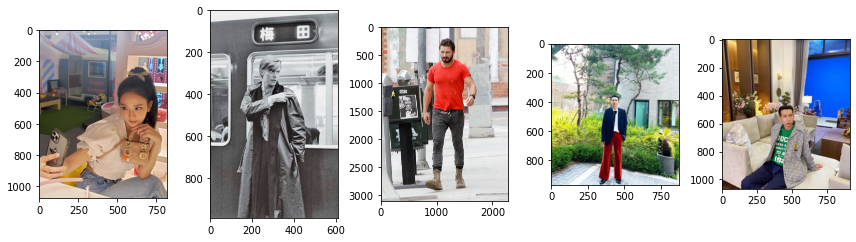

In [8]:
image_shower(img_list)

## 3. Loding 'DeepLabModel' (Tensorflow V1 version)

In [9]:
class DeepLabModel(object):
    INPUT_TENSOR_NAME = 'ImageTensor:0'
    OUTPUT_TENSOR_NAME = 'SemanticPredictions:0'
    INPUT_SIZE = 513
    FROZEN_GRAPH_NAME = 'frozen_inference_graph'

    # __init__()에서 모델 구조를 직접 구현하는 대신, tar file에서 읽어들인 그래프구조 graph_def를 
    # tf.compat.v1.import_graph_def를 통해 불러들여 활용하게 됩니다. 
    def __init__(self, tarball_path):
        self.graph = tf.Graph()
        graph_def = None
        tar_file = tarfile.open(tarball_path)
        for tar_info in tar_file.getmembers():
            if self.FROZEN_GRAPH_NAME in os.path.basename(tar_info.name):
                file_handle = tar_file.extractfile(tar_info)
                graph_def = tf.compat.v1.GraphDef.FromString(file_handle.read())
                break
        tar_file.close()

        with self.graph.as_default():
            tf.compat.v1.import_graph_def(graph_def, name='')

        self.sess = tf.compat.v1.Session(graph=self.graph)

    # 이미지를 전처리하여 Tensorflow 입력으로 사용 가능한 shape의 Numpy Array로 변환합니다.
    def preprocess(self, img_orig):
        height, width = img_orig.shape[:2]
        resize_ratio = 1.0 * self.INPUT_SIZE / max(width, height)
        target_size = (int(resize_ratio * width), int(resize_ratio * height))
        resized_image = cv2.resize(img_orig, target_size)
        resized_rgb = cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB)
        img_input = resized_rgb
        return img_input
        
    def run(self, image):
        img_input = self.preprocess(image)

        # Tensorflow V1에서는 model(input) 방식이 아니라 sess.run(feed_dict={input...}) 방식을 활용합니다.
        batch_seg_map = self.sess.run(
            self.OUTPUT_TENSOR_NAME,
            feed_dict={self.INPUT_TENSOR_NAME: [img_input]})

        seg_map = batch_seg_map[0]
        return cv2.cvtColor(img_input, cv2.COLOR_RGB2BGR), seg_map

Load the pretrained weight provided by Google.

Pretrained weight: deeplabv3_mnv2_pascal_train_aug_2018_01_29

In [10]:
# define model and download & load pretrained weight
_DOWNLOAD_URL_PREFIX = 'http://download.tensorflow.org/models/'

model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
tf.io.gfile.makedirs(model_dir)

print ('temp directory:', model_dir)

download_path = os.path.join(model_dir, 'deeplab_model.tar.gz')
if not os.path.exists(download_path):
    urllib.request.urlretrieve(_DOWNLOAD_URL_PREFIX + 'deeplabv3_mnv2_pascal_train_aug_2018_01_29.tar.gz',
                   download_path)

MODEL = DeepLabModel(download_path)
print('model loaded successfully!')

temp directory: /aiffel/aiffel/human_segmentation/models
model loaded successfully!


## Image segmentation using DeepLabModel

In [11]:
def segmentation_check(img, model, verbose=0):
    # PASCAL VOC Label names are
    LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
    ]
    
    img_resized, seg_map = model.run(img)
    if verbose == 1:
        print(img.shape, img_resized.shape, LABEL_NAMES[seg_map.max()])
    return img_resized, seg_map

In [12]:
for img in img_list:
    segmentation_check(img, MODEL, verbose=1)

(1076, 818, 3) (513, 389, 3) person
(990, 609, 3) (513, 315, 3) train
(3100, 2284, 3) (513, 377, 3) person
(968, 876, 3) (513, 464, 3) pottedplant
(1066, 912, 3) (513, 438, 3) sofa


In [13]:
def segmentation_person(img_resized, seg_map, verbose=0):
    
    img_show = img_resized.copy()
    seg_map = np.where(seg_map == 15, 15, 0)
    img_mask = seg_map * (255/seg_map.max())
    img_mask = img_mask.astype(np.uint8)

    if verbose == 1:
        color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
        img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.35, 0.0)
        plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
        plt.show()

    return img_mask


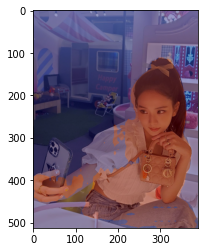

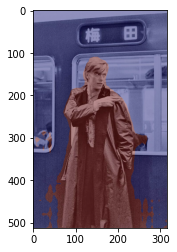

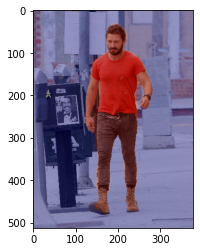

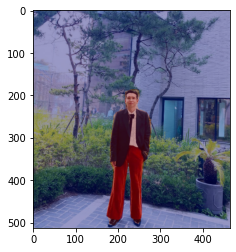

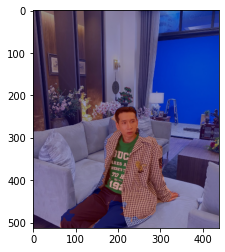

In [14]:
seg_img_list = []

for img in img_list:
    img_resized, seg_map = segmentation_check(img, MODEL)
    seg_img = segmentation_person(img_resized, seg_map, verbose=1)
    seg_img_list.append(seg_img)

Resize the segmentation result to original size.

In [15]:
def resize_img(img_mask, img_orig, verbose=0):
    
    img_mask_up = cv2.resize(img_mask, img_orig.shape[:2][::-1], 
                             interpolation=cv2.INTER_LINEAR)
    
    _, img_mask_up = cv2.threshold(img_mask_up, 128, 255, cv2.THRESH_BINARY)
    
    if verbose == 1:
        ax = plt.subplot(1,2,1)
        plt.imshow(img_mask_up, cmap=plt.cm.binary_r)
        ax.set_title('Original Size Mask')

        ax = plt.subplot(1,2,2)
        plt.imshow(img_mask, cmap=plt.cm.binary_r)
        ax.set_title('DeepLab Model Mask')

        plt.show()
        
    return img_mask_up

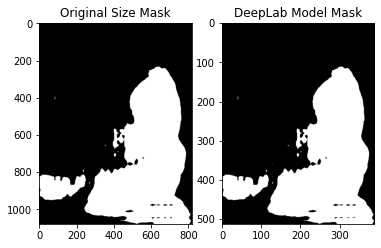

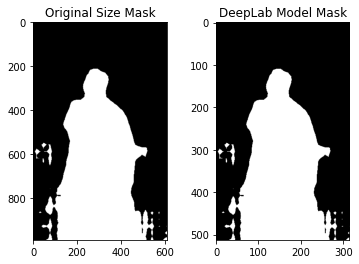

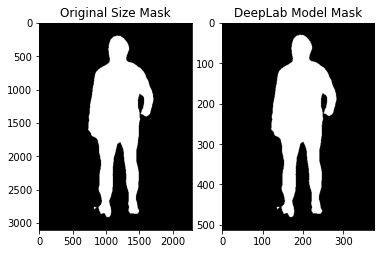

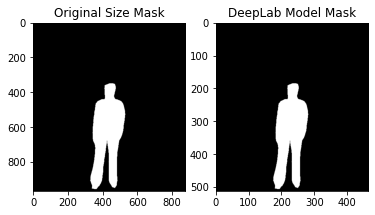

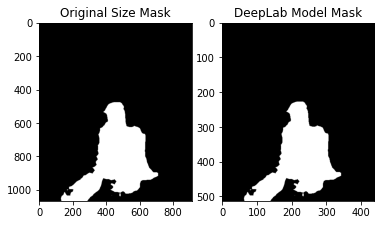

In [16]:
re_seg_img_list = []

for img_mask, img_orig in zip(seg_img_list, img_list):
    img_mask_up = resize_img(img_mask, img_orig, verbose=1)
    re_seg_img_list.append(img_mask_up)

In [60]:
re_seg_img_list[0].shape

(1076, 818)

Blurring the backgroud

In [17]:
def blur_image(img, verbose=0, kernel_size=(13,13)):
    img_blur = cv2.blur(img, kernel_size) #(13,13)은 blurring  kernel size를 뜻합니다.
    
    if verbose == 1:
        plt.imshow(cv2.cvtColor(img_blur, cv2.COLOR_BGR2RGB))
        plt.show()
        
    return img_blur

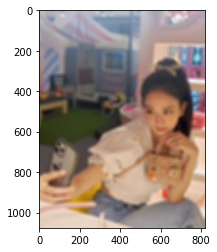

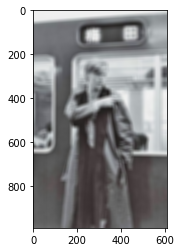

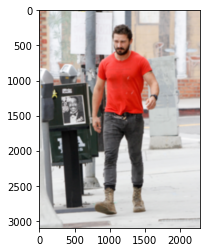

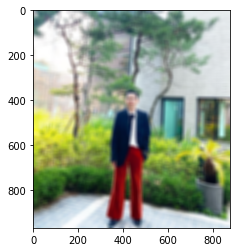

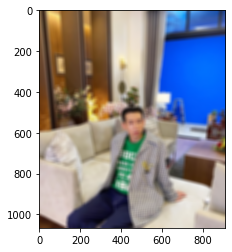

In [18]:
blur_img_list = []

for img in img_list:

    img_blur = blur_image(img, verbose=1, kernel_size=(20,20))
    blur_img_list.append(img_blur)

In [19]:
def extract_bg(img_orig_blur, img_mask_up, verbose=0):
    
    img_mask_color = cv2.cvtColor(img_mask_up, cv2.COLOR_GRAY2BGR)
    img_bg_mask = cv2.bitwise_not(img_mask_color)
    img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
    
    if verbose == 1:
        plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
        plt.show()
        
    return img_bg_blur, img_mask_color

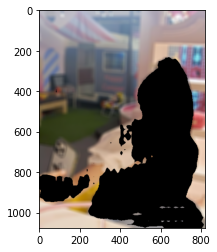

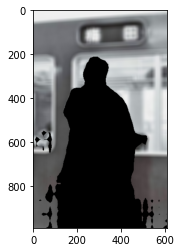

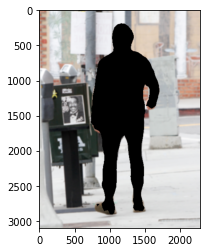

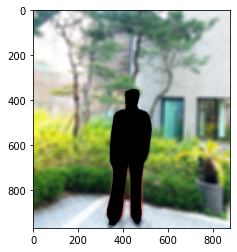

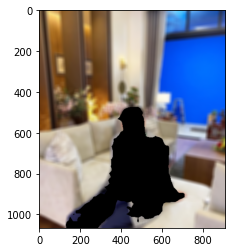

In [20]:
img_bg_blur_list = []
for img_orig_blur, img_mask_up in zip(blur_img_list, re_seg_img_list):
    img_bg_blur = extract_bg(img_orig_blur, img_mask_up, verbose=1)
    img_bg_blur_list.append(img_bg_blur)

Concat blurred background and the original images.

In [21]:
def concat_images(img_orig, img_bg_blur, img_mask_color, verbose=0):
    
    img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
    
    if verbose == 1:
        plt.figure(figsize=(8,8))
        plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
        plt.show()
        
    return img_concat

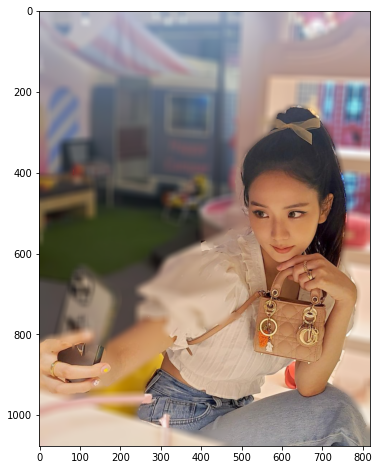

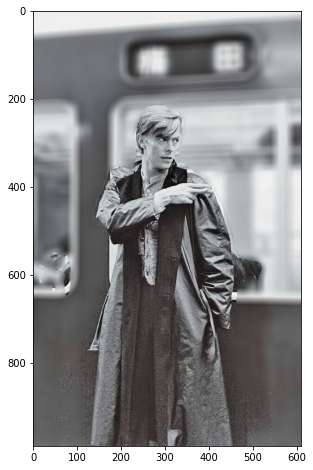

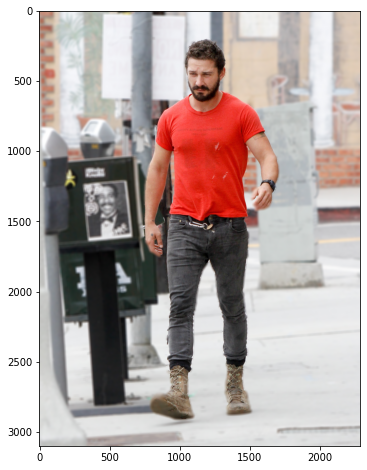

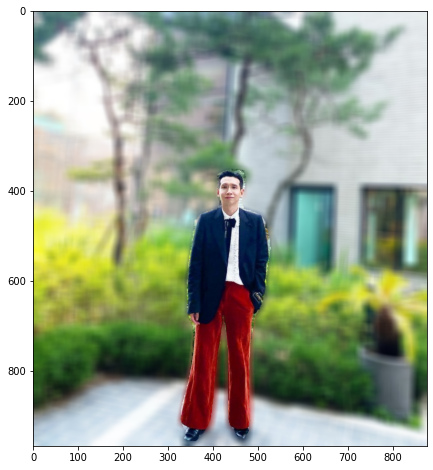

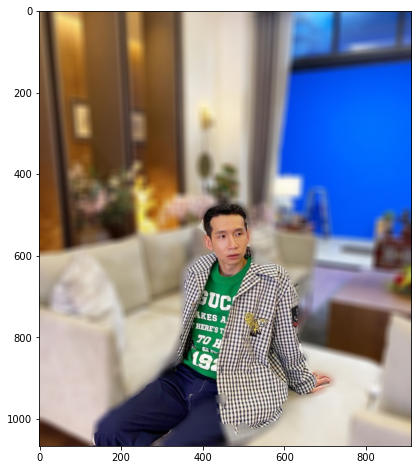

In [22]:
img_concat_list = []

for img_orig, bg_mask in zip(img_list, img_bg_blur_list):
    
    img_bg_blur = bg_mask[0]
    img_mask_color = bg_mask[1]
    
    img_concat = concat_images(img_orig, img_bg_blur, img_mask_color, verbose=1)
    img_concat_list.append(img_concat)


In [23]:
def compare_results(img_list, img_concat_list):
    
    num_imgs = len(img_list)
    fig, axes = plt.subplots(nrows=num_imgs, ncols=2, figsize=(16,16))
    
    for i, (img_orig, img_concat) in enumerate(zip(img_list, img_concat_list)):
        
        axes[i][0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
        axes[i][0].set_title("ORIGINAL IMAGE", fontweight='bold')
        
        axes[i][1].imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
        axes[i][1].set_title("SELF PORTRAIT MODE IMAGE", fontweight='bold')
        
    fig.tight_layout()

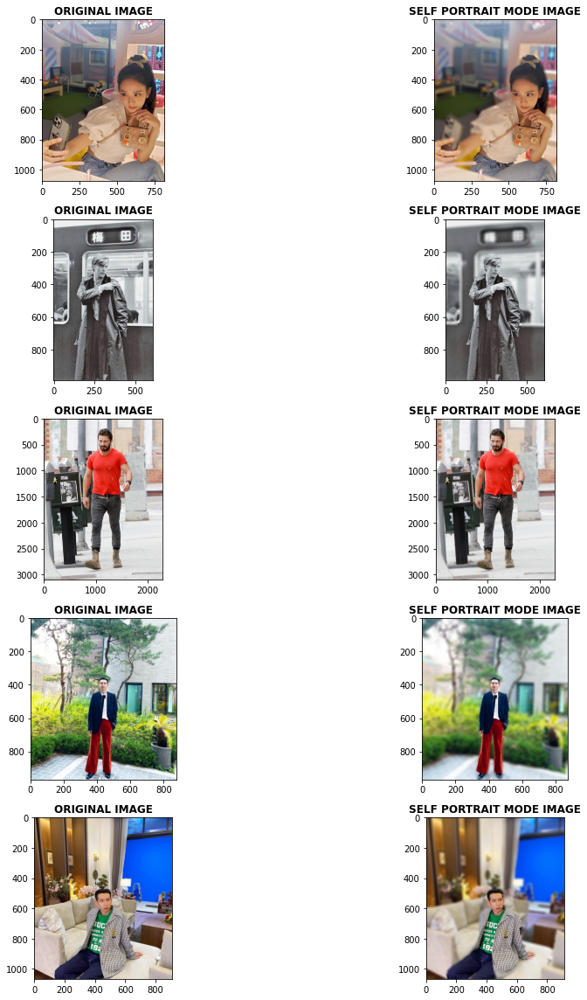

In [24]:
compare_results(img_list, img_concat_list)

- [ ] 지진희 사진으로 거울에 있는 지진희 말고 지진희만 분류하게 할 수 있을까?

## 인물사진 만들기 함수

지금까지의 과정을 하나의 함수로 표현해 추후 문제점 파악 및 개선에 사용할 수 있도록 구현하겠습니다. 이 때 인자로 kernel_size를 받도록 하겠습니다.

In [66]:
def self_portrait_img(img_list, kernel_size=(20, 20)):

    ## segment

    seg_img_list = []

    for img in img_list:
        img_resized, seg_map = segmentation_check(img, MODEL)
        seg_img = segmentation_person(img_resized, seg_map, verbose=0)
        seg_img_list.append(seg_img)

    ## resize

    re_seg_img_list = []

    for img_mask, img_orig in zip(seg_img_list, img_list):
        img_mask_up = resize_img(img_mask, img_orig, verbose=0)
        re_seg_img_list.append(img_mask_up)

    ## blur whole image

    blur_img_list = []
    for img in img_list:

        img_blur = blur_image(img, verbose=0, kernel_size=kernel_size)
        blur_img_list.append(img_blur)

    ## blur background

    img_bg_blur_list = []
    for img_orig_blur, img_mask_up in zip(blur_img_list, re_seg_img_list):
        img_bg_blur = extract_bg(img_orig_blur, img_mask_up, verbose=0)
        img_bg_blur_list.append(img_bg_blur)

    ## concat

    img_concat_list = []

    for img_orig, bg_mask in zip(prob_img_list, img_bg_blur_list):

        img_bg_blur = bg_mask[0]
        img_mask_color = bg_mask[1]

        img_concat = concat_images(img_orig, img_bg_blur, img_mask_color, verbose=0)
        img_concat_list.append(img_concat)
    
    return img_concat_list
    

## What's the problem? - (1): 과하게 segmentation을 한 경우(Too much blur!)


문제는 결국 모델이 segmentation을 적절하게 하지 못했기 때문에 애초에 사람 객체의 일부로 표현이 되지 않은 부분이 있고 이에 따라 완벽하지 못한 인물사진모드가 되버리는 것입니다.

이 문제를 해결하기 위해 우선 그럴듯하게 보이게 하기 또는 다양한 선택지를 주는 방법을 생각해보았습니다.

In [83]:
prob_img_list = []
prob_img_list.append(img_list[0]) ## add 지수
prob_img_list.append(img_list[4]) ## add 봉태규

img_concat_list = self_portrait_img(prob_img_list, kernel_size=(20, 20))

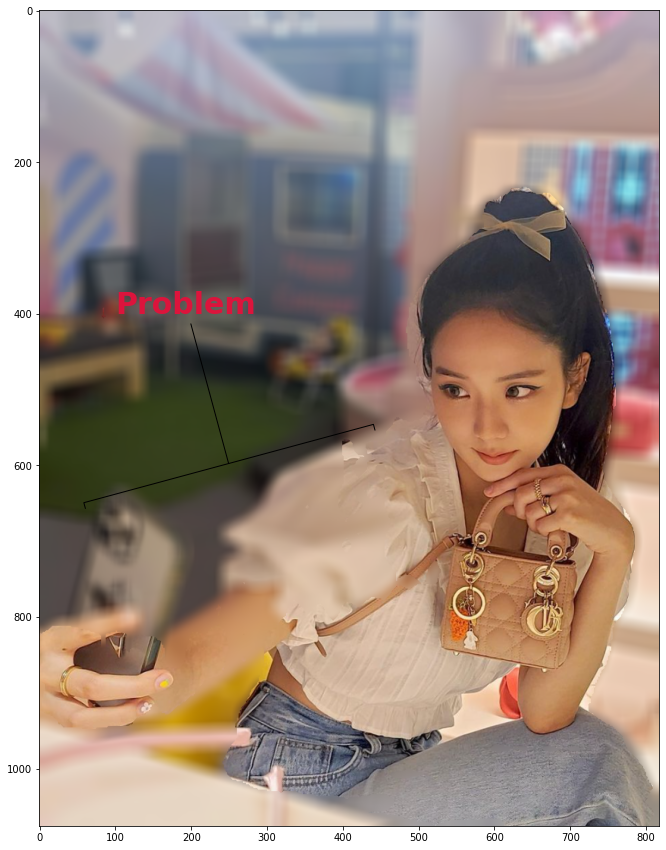

In [84]:
fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(cv2.cvtColor(img_concat_list[0], cv2.COLOR_BGR2RGB))

# t = ax.text(150, 500, "Direction", ha="center", va="center", rotation=315, size=30,
#             bbox=dict(boxstyle="rarrow, pad=0.3", fc="royalblue", ec="b", lw=2))


t = ax.annotate("Problem",
                xy=(250, 600), xycoords='data',
                xytext=(100, 400), textcoords='data',
                arrowprops=dict(arrowstyle="-[, widthB=5.0",
                                connectionstyle="arc3"),
                fontsize=30, color='crimson', fontweight='bold'
               )

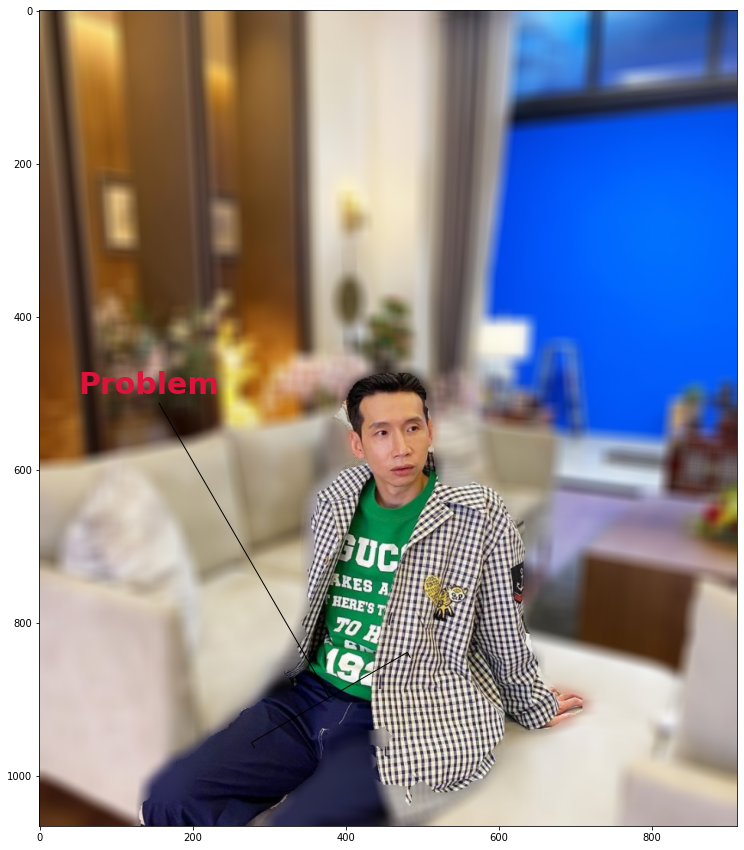

In [85]:
fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(cv2.cvtColor(img_concat_list[1], cv2.COLOR_BGR2RGB))


t = ax.annotate("Problem",
                xy=(380, 900), xycoords='data',
                xytext=(50, 500), textcoords='data',
                arrowprops=dict(arrowstyle="-[, widthB=3.0",
                                connectionstyle="arc3"),
                fontsize=30, color='crimson', fontweight='bold'
               )

애초에 segmentation을 할 때 분리를 제대로 하지 못했습니다. 실제 경계보다 더 좁게 segmentation을 한 경우라고 볼 수 있습니다. 따라서 윗 사진 경우 어깨 부분이 함께 blur 처리됐고 아래 사진도 다리가 blur 됐습니다.

### Solution1:
우선 다른 모델을 사용한다거나 하는 방법이 아닌 현재 상황에서 좋은 솔루션을 찾을 수 있을까 생각을 하다가 여러개의 선택지를 주는 방법을 생각하게 됐습니다.
위에서 만든 함수를 이용해서 특정 커널사이즈 둘의 조합으로 적절한 값을 제시하는 방법을 먼저 생각할 수 있었습니다.

In [68]:
img_concat_5_list = self_portrait_img(prob_img_list, (5, 5))
img_concat_30_list = self_portrait_img(prob_img_list, (30, 3))

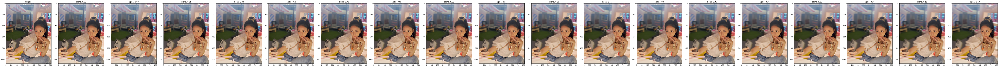

In [77]:
img1 = img_concat_5_list[0]
img2 = img_concat_30_list[0]

alphas = np.arange(0.1,1,0.05)[::-1]
fig, axes = plt.subplots(nrows=1, ncols=len(alphas)+1, figsize=(95, 10))
axs = axes.ravel()
axs[0].imshow(cv2.cvtColor(prob_img_list[0], cv2.COLOR_BGR2RGB))
axs[0].set_title("Original")

for idx, alpha in enumerate(alphas):

    dst = cv2.addWeighted(img1, alpha, img2, (1-alpha), 0) 
    axs[idx+1].imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
    axs[idx+1].set_title(f"alpha: {alpha:.2f}")

fig.tight_layout()

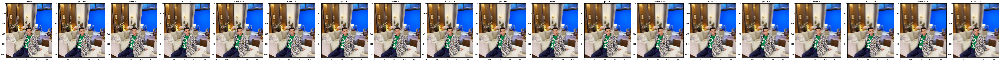

In [76]:
img1 = img_concat_5_list[1]
img2 = img_concat_30_list[1]

alphas = np.arange(0.1,1,0.05)[::-1]
fig, axes = plt.subplots(nrows=1, ncols=len(alphas)+1, figsize=(95, 10))
axs = axes.ravel()
axs[0].imshow(cv2.cvtColor(prob_img_list[1], cv2.COLOR_BGR2RGB))
axs[0].set_title("Original")

for idx, alpha in enumerate(alphas):

    dst = cv2.addWeighted(img1, alpha, img2, (1-alpha), 0) 
    axs[idx+1].imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
    axs[idx+1].set_title(f"alpha: {alpha:.2f}")

fig.tight_layout()  

### Solution 1-(1):
위 방법과 비슷하게, 그리고 좀 더 간단하게 커널사이즈를 계속해서 바꿔주면서 다양한 선택지를 제시해주는 방법을 구현해보겠습니다.

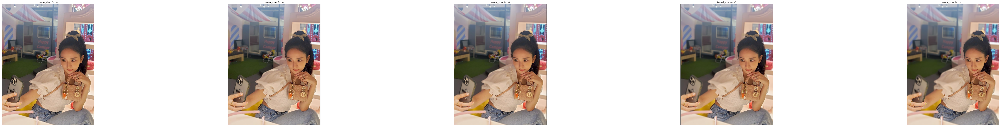

In [80]:
kernel_size_list = [(3, 3), (5, 5), (7, 7), (9, 9), (11, 11)]

img_len = len(kernel_size_list) 
fig, axes = plt.subplots(nrows=1, ncols=img_len, figsize=(95, 10))

for idx, kernel_size in enumerate(kernel_size_list):
    
    img_concat_list = self_portrait_img(prob_img_list, kernel_size=kernel_size)
    
    
    axes[idx].imshow(cv2.cvtColor(img_concat_list[0], cv2.COLOR_BGR2RGB))
    axes[idx].set_title(f"kernel_size: {kernel_size}")
    axes[idx].set_xticks([])
    axes[idx].set_yticks([])
    

fig.tight_layout()

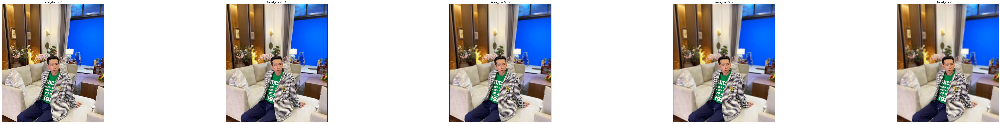

In [81]:
kernel_size_list = [(3, 3), (5, 5), (7, 7), (9, 9), (11, 11)]

img_len = len(kernel_size_list) 
fig, axes = plt.subplots(nrows=1, ncols=img_len, figsize=(95, 10))

for idx, kernel_size in enumerate(kernel_size_list):
    
    img_concat_list = self_portrait_img(prob_img_list, kernel_size=kernel_size)
    
    
    axes[idx].imshow(cv2.cvtColor(img_concat_list[1], cv2.COLOR_BGR2RGB))
    axes[idx].set_title(f"kernel_size: {kernel_size}")
    axes[idx].set_xticks([])
    axes[idx].set_yticks([])
    

fig.tight_layout()

## What's the problem? - (2): 부족하게 segmentation을 한 경우(Too less blur!)

다음은 부족하게 segmentation을 한 경우로 앞선 문제와 반대로 경계를 넓게 잡아서 blur가 되지 않은 부분이 있는 경우입니다. 노드에서 예제로 주어진 사진의 경우가 해당하는 경우이며 아래의 경우도 자세히 살펴보면 그런 문제를 보이고 있습니다.

In [87]:
prob_img_list = []
prob_img_list.append(img_list[3]) ## add 봉태규

img_concat_list = self_portrait_img(prob_img_list, kernel_size=(20, 20))

In [240]:
len(prob_img_list)

1

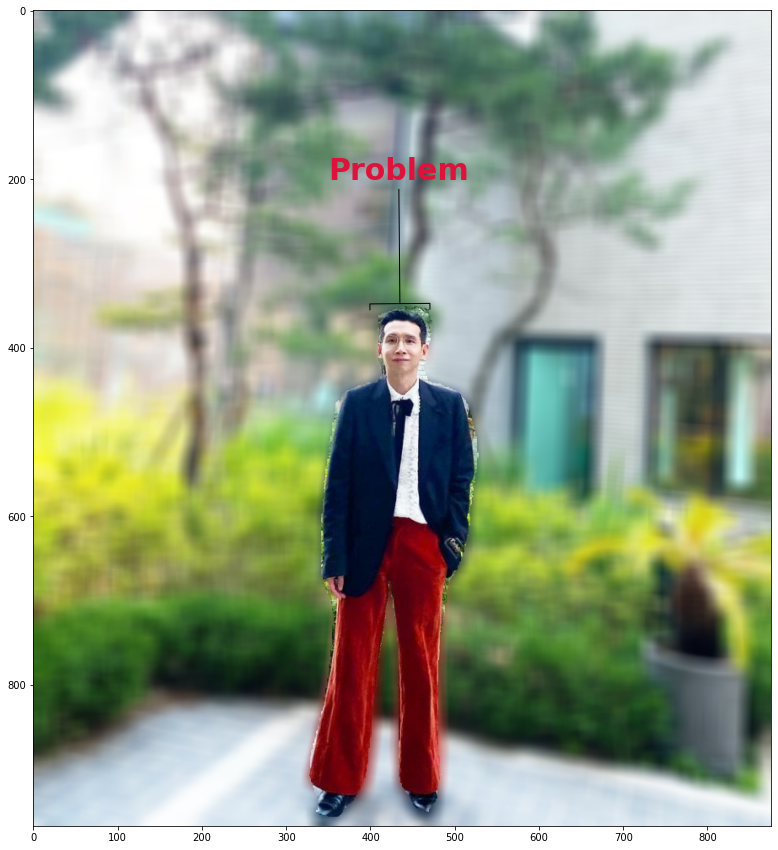

In [98]:
fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(cv2.cvtColor(img_concat_list[0], cv2.COLOR_BGR2RGB))


t = ax.annotate("Problem",
                xy=(435, 350), xycoords='data',
                xytext=(350, 200), textcoords='data',
                arrowprops=dict(arrowstyle="-[, widthB=1.0",
                                connectionstyle="arc3"),
                fontsize=30, color='crimson', fontweight='bold'
               )

경계면을 미리 blur 처리하는 방법으로 해결할 수 있을거란 생각이 들었습니다. 미리 이 아이디어를 생각하고 구현해주신 유상민님의 [글](https://aiffel.agit.io/g/300308438/wall/324487270#comment_panel_324502820)을 많이 참고했습니다.

따라서 기존의 함수에서 필요한 부분을 빼내기 위해 반환값들을 추가한 함수를 구현해보겠습니다.

In [301]:
def self_portrait_img_2(img_list, kernel_size=(20, 20), b_kernel_size=(20, 20)):

    ## segment

    seg_img_list = []

    for img in img_list:
        img_resized, seg_map = segmentation_check(img, MODEL)
        seg_img = segmentation_person(img_resized, seg_map, verbose=0)
        seg_img_list.append(seg_img)

    ## resize

    re_seg_img_list = []

    for img_mask, img_orig in zip(seg_img_list, img_list):
        img_mask_up = resize_img(img_mask, img_orig, verbose=0)
        re_seg_img_list.append(img_mask_up)
    
    ## mask 추출해서 blur 처리한 mask, 1 - blur 처리한 mask 구하기.
    mask_list = []
    mask_blur_list = []
    r_mask_blur_list = []
    for mask in re_seg_img_list:
        
        mask = np.stack([mask, mask, mask], axis=2).astype(np.uint8)
        mask_list.append(mask)
        
        mask_blur = (cv2.blur(mask, (25, 25))/255.).astype(np.float32)
        mask_blur_list.append(mask_blur)
        
        r_mask_blur = (1 - mask_blur)
        r_mask_blur_list.append(r_mask_blur)
        
        
    
    ## 원본이미지 * 경계만 보이는 마스크(mask_blur)
    mask_blur_img_list = []
    for img, mask_blur in zip(img_list, mask_blur_list):
        mask_blur_img = ((img/255.) * mask_blur).astype(np.float32)
        mask_blur_img_list.append(mask_blur_img)
        
        
    blur_img_list = []
    for img in img_list:

        img_blur = blur_image(img, verbose=0, kernel_size=kernel_size)
        blur_img_list.append(img_blur)
    
    ## 경계 블러 + 전체 블러 이미지 (r_mask_blur * blur_img)
    wh_blur_list = []
    for r_mask_blur, blur_img in zip(r_mask_blur_list, blur_img_list):
        wh_blur = r_mask_blur * blur_img.astype(np.float32)
        wh_blur = wh_blur / 255.
        wh_blur_list.append(wh_blur)
        
    
    ## 합쳐서 더 blur 된 이미지로
    new_img_list = []

    for mask_blur_img, wh_blur in zip(mask_blur_img_list, wh_blur_list):
        new_img = mask_blur_img + wh_blur
        new_img_list.append(new_img)
    
    
    return new_img_list

In [302]:
new_img_list = self_portrait_img_2(prob_img_list, kernel_size=(20, 20), b_kernel_size=(30, 30))

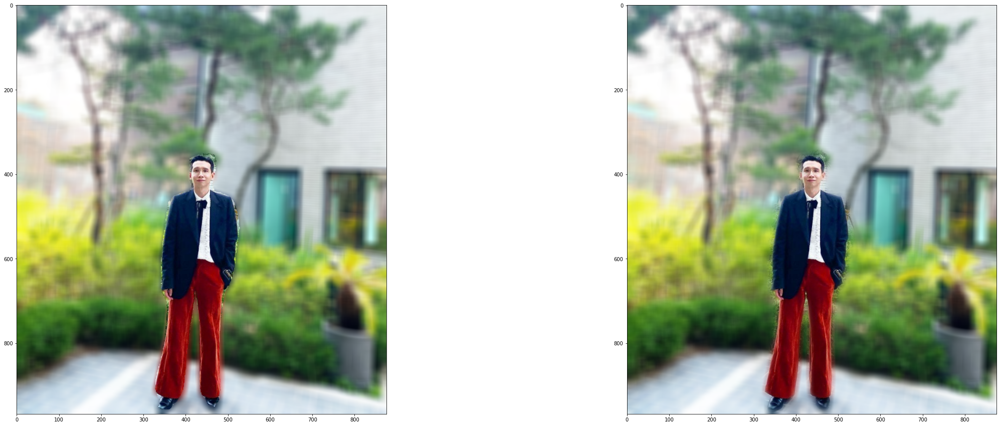

In [306]:
fig, axes = plt.subplots(figsize=(40, 15), nrows=1, ncols=2)
axs = axes.ravel()
axs[0].imshow(cv2.cvtColor(img_concat_list[0], cv2.COLOR_BGR2RGB))
axs[1].imshow(cv2.cvtColor(new_img_list[0], cv2.COLOR_BGR2RGB))

확실히 이전보다는 경계면에 blur가 추가되어 조금 더 자연스러워보입니다.

## NEW MODEL

문제의 원인을 다시 되짚어보면 segmentation 자체에 문제가 있었습니다. 간단하게 [detectron2](https://detectron2.readthedocs.io/en/latest/tutorials/getting_started.html) 라는 API를 이용해 segmentation을 해보겠습니다.

detectron2에서 제공하는 공식 [데모](https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5)에서 대부분을 참고해 작성해봤습니다.

해당 부분은 [colab notebook](https://colab.research.google.com/drive/1VgAaTF8bMJQYDC-HN_2WmbTNEZl-Tqtz?usp=sharing)으로 링크만 넣어두겠습니다. 단순 구현이기도 하고 클라우드 환경에서 하는 데 수정해야할 부분이 있지만 미처 수정하지 못했기 때문입니다.

## Struct2depth

노드에 참고로 나와있는 Struct2Depth 관련해서 구현을 해보려고 했으나, checkpoint file이 없어서 meta 파일로 그래프를 만들지 못해서 구현에 실패했습니다.

[NEED CHECKPOINT FILE](https://github.com/tensorflow/tensorflow/issues/19721)

[HOW TO USE META DATA]
(https://jangjy.tistory.com/297)

[HOW TO USE META DATA2]
(https://goodtogreate.tistory.com/entry/Saving-and-Restoring)

## 소감

segmentation이 잘 되지않아 문제인 상황에서 
1. 우선 기존의 가진 것만 가지고 어떻게 사용자로 하여금 괜찮아 보이는 솔루션을 제안할 수 있을까 고민을 했습니다.
    * 이 방식을 추가적으로 개선하고 수정할 수 있다면, 사용자가 직접 마음에 안 드는 부분을 수정할 수 있게 하고 이를 또 하나의 라벨로 받아들여 다시 학습에 이용할 수 있는 방향으로 개선할 수 있을 것 같습니다. ['Data flywheels'](https://www.cbinsights.com/research/team-blog/data-network-effects/)
    
2. 경계를 blur 처리해 조금 더 자연스럽게 보일 수 있다는 생각은 했으나 구현에 어려움을 겪고 있는 상황에서 아지트에서 본 유상민님의 글을 참고해 수정해 볼 수 있었습니다.
    * cv2를 이용한 작은 수정을 통해 더욱 그럴듯하게 보일 수 있게 할 수 있다는 점을 깨달았습니다.
    
이외에도 다양한 시도를 해보려고 했습니다. 노드 내용처럼 깊이 카메라를 활용하려면 2개의 카메라를 사용했다는 데에서 Depth라는 것이 결국은 원근감과 비슷한 개념으로 느껴졌습니다. 따라서 이미지를 픽셀 단위로 옮기고 하다보면 괜찮아지지 않을까 생각도 해보고 좌우 반전을 했을 때도 결과가 똑같이 나오는 지에 대해서도 많은 시도를 해봤습니다. 모두 좋은 성과를 내지는 못해 따로 남겨두지는 않았습니다.

아쉬웠던 건 시간의 부족, 구현능력의 부족으로 *Struct2Depth를 구현해보지 못했다는 점*, SOTA 모델인 *MaskFormer*를 구현해보지 못했다는 점이 아쉽습니다. 이론도 좋지만 구현능력도 더 길러야겠다고 느껴지는 노드였습니다.

1. 많은 segmentation의 SOTA 논문을 눈으로나마 무엇이 있는 지 알 수 있었고, 대부분의 모델이 transformer를 많이 사용하고 있다는 점이 눈에 띄었습니다.


2. bayesian deeplearning에서의 uncertainty 개념으로 경계를 부드럽게 해줄 수 있다는 논문을 들어본 것 같은데 좀 더 공부해보면 좋을 것 같습니다.